In [117]:
import tweepy
import json
import pandas as pd
from time import sleep
import datetime
import os
from textblob import TextBlob
from config import keys as k
import re as re
%matplotlib inline
import networkx as nx
import matplotlib.pyplot as plt
import numpy as numpy

In [249]:
class tweets():
    def __init__(self,keys):
        #Authentication using keys & accesstoken
        auth = tweepy.OAuthHandler(keys.consumer_key, keys.consumer_secret)
        auth.set_access_token(keys.access_token, keys.access_secret)
        self.api = tweepy.API(auth, wait_on_rate_limit=True)
    def get_user(self,user_name):
        user = self.api.get_user(user_name)
        name = user.name
        id_str =user.id_str
        description = user.description
        location = user.location
        timeZone = user.time_zone
        friendCount = user.friends_count
        followersCount = user.followers_count
        statuses_count = str(user.statuses_count)
    def get_user_timeline(self,user,count=1000):
        try:
            statuses=self.api.user_timeline(count=count,tweet_mode='extended',screen_name=user)
        except tweepy.TweepError as e:
            print (e.reason)
        return statuses
    def sentiment_analysis(self,qu):
        for tweet in qu:
            print (tweet.text)
            analysis = TextBlob(tweet.text)
            print (analysis.sentiment)
            print ('-'*50)
    def get_followers(self,sn):
        ids = []
        count = 0;
        
        for page in tweepy.Cursor(self.api.followers_ids, screen_name=sn).pages():
            ids.extend(page)
            sleep(60)
            print (len(ids))
            count = count+1
            if (count >= 99):
                break
        return ids
    def get_following(self, sn):
        ids = []
        count = 0
        for page in tweepy.Cursor(self.api.friends_ids, screen_name=sn).pages():
            ids.extend(page)
            sleep(60)
            print (len(ids))
            count = count+1
            if (count >= 99):
                break
        return ids
    def get_tweets_by_location(self):
        try:
            statuses=self.api.reverse_geocode(lat = 42.334443, long = -71.064726, ip='104.156.206.77', accuracy= 100000, granularity = 'city', max_results = 1000)
        except tweepy.TweepError as e:
            print (e.reason)
        return statuses
    def tweet_to_df(self, txt, numberOfItems):
        tweet = self.api.search(q=txt)
        tmplst=[]
        for tweet in tweepy.Cursor(self.api.search, lang='en',q=txt,tweet_mode='extended').items(numberOfItems):
                tmplst.append({'tweet_id':tweet.id_str,
                             'created_at':tweet.created_at,
                              'rewteet_count':tweet.retweet_count,
                               'retweet_status':tweet.retweeted,
                               'entities_url':tweet.entities['urls'],
                               'coordinates':tweet.coordinates,
                               'entities_hashtags':tweet.entities['hashtags'],
                               'entities_mentions':tweet.entities['user_mentions'],
                               'in_reply_to_screen_name':tweet.in_reply_to_screen_name,
                               'in_reply_to_status_id':tweet.in_reply_to_status_id,
                              'favorite_count':tweet.favorite_count,
                              'full_text':tweet.full_text,
                               'language':tweet.lang,
                               'from_user_listed_count':tweet.user.listed_count,
                              'from_user_id':tweet.user.id,
                               'from_user_statuses_count':tweet.user.statuses_count,
                               'from_user_friends_count':tweet.user.friends_count,
                               'from_user_created_at':tweet.user.created_at,
                               'from_user_favourites_count':tweet.user.favourites_count,
                              'from_user_screen_name':tweet.user.name,
                              'from_user_location':tweet.user.location,
                              'from_user_followers_count':tweet.user.followers_count,
                                'from_user_description':tweet.user.description,
                               'from_user_statuses_count':tweet.user.statuses_count,
                               'from_user_location':tweet.user.location,
                              'source':tweet.source})
        df=pd.DataFrame(tmplst)
        return df
    def create_edgelist(self, user):
        followers = t.get_followers(user)
        following = t.get_following(user)
        seedNode = twitterUser(k, user)
        list1 = []
        list2 = []
        for x in followers:
            user = twitterUser(k, x)
            list1.append(user.name)
        for x in following:
            user2 = twitterUser(k, x)
            list2.append(user2.name)
        right = [seedNode.name] * len(list1)
        followers_edgelist = list(zip(list1,right))
        following_edgelist = list(zip(right,list2))
        edgelist = followers_edgelist + following_edgelist
        return edgelist
    def add_attributes(self, user, graph):
            followers = t.get_followers(user)
            following = t.get_following(user)
            for x in followers:
                user = twitterUser(k, x)
                attrs = {user.name: {'location': user.location, 'friends_count': user.friends_count,'followers_count': user.followers_count, 'statuses_count': str(user.statuses_count)}}
                nx.set_node_attributes(graph, attrs)
            for x in following:
                user2 = twitterUser(k, x)
                attrs1 = {user2.name: {'location': user2.location, 'friends_count': user2.friends_count,'followers_count': user2.followers_count, 'statuses_count': str(user2.statuses_count)}}
                nx.set_node_attributes(graph, attrs1)


SyntaxError: invalid syntax (<ipython-input-249-952a771c9345>, line 20)

In [26]:
class twitterUser:
    def __init__(self,keys, user_name):
        #I believe this authenticates every time this object is created which is really inefficient but 
        #I couldn't figure out a better way to do this
        #Authentication using keys & accesstoken
        auth = tweepy.OAuthHandler(keys.consumer_key, keys.consumer_secret)
        auth.set_access_token(keys.access_token, keys.access_secret)
        self.api = tweepy.API(auth, wait_on_rate_limit=True)
        
        user = self.api.get_user(user_name)

        self.name = user.name
        self.id_str = user.id_str
        self.description = user.description
        self.location = user.location
        self.time_zone = user.time_zone
        self.friends_count = user.friends_count
        self.followers_count = user.followers_count
        self.statuses_count = user.statuses_count
        
    def user_to_string(self):
        print(self.name, self.id_str, self.description, self.location, self.time_zone, self.friends_count, self.followers_count, self.statuses_count)
   
        

In [239]:
t = tweets(k)

In [252]:
timeline = t.get_user_timeline("sebastian_paul")
timeline

[Status(_api=<tweepy.api.API object at 0x10ea1c240>, _json={'created_at': 'Mon Nov 26 21:20:19 +0000 2018', 'id': 1067166183118594049, 'id_str': '1067166183118594049', 'full_text': '@gattaca Restating the problem from a different viewpoint IS often the solution.\n\n(It might not be the solution we need, but it is the solution we deserve.)', 'truncated': False, 'display_text_range': [9, 156], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'gattaca', 'name': 'Dave Lewis', 'id': 1088411, 'id_str': '1088411', 'indices': [0, 8]}], 'urls': []}, 'source': '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>', 'in_reply_to_status_id': 1067044941451444225, 'in_reply_to_status_id_str': '1067044941451444225', 'in_reply_to_user_id': 1088411, 'in_reply_to_user_id_str': '1088411', 'in_reply_to_screen_name': 'gattaca', 'user': {'id': 308575490, 'id_str': '308575490', 'name': 'Sebastian Paul', 'screen_name': 'sebastian_paul', 'location': 

In [226]:
df = pd.read_csv('/Users/ryangould/Downloads/df1_sam.txt', sep = ',')

In [233]:
df['entities_hashtags']

0                                                   []
1                                                   []
2                                                   []
3                                                   []
4    [{'text': 'ClimateChange', 'indices': [197, 21...
5                                                   []
6                                                   []
7                                                   []
8                                                   []
9                                                   []
Name: entities_hashtags, dtype: object

In [60]:
methodList = t.create_edgelist("bilcorry")

535
151


In [68]:
methodList1 = t.create_edgelist("sebastian_paul")

184
168


In [65]:
methodList2 = t.create_edgelist("BerghoferJulia")

103
187


In [73]:
methodList3 = t.create_edgelist("nukelar_juice")

61
30


In [78]:
methodList4 = t.create_edgelist("Taylor_SJ")

77
338


In [82]:
methodList5 = t.create_edgelist("Chrisjhancock")

73
132


In [85]:
methodList6 = t.create_edgelist("dangeruss86")

68
241


In [90]:
methodList7 = t.create_edgelist("Sofia_Wakum")

149
192


In [93]:
methodList8 = t.create_edgelist("TakaharuOgasa")

249
294


In [216]:
graph = nx.DiGraph(methodList1 + methodList2 + methodList3 + methodList4 + methodList5 + methodList6 + methodList7 + methodList8)

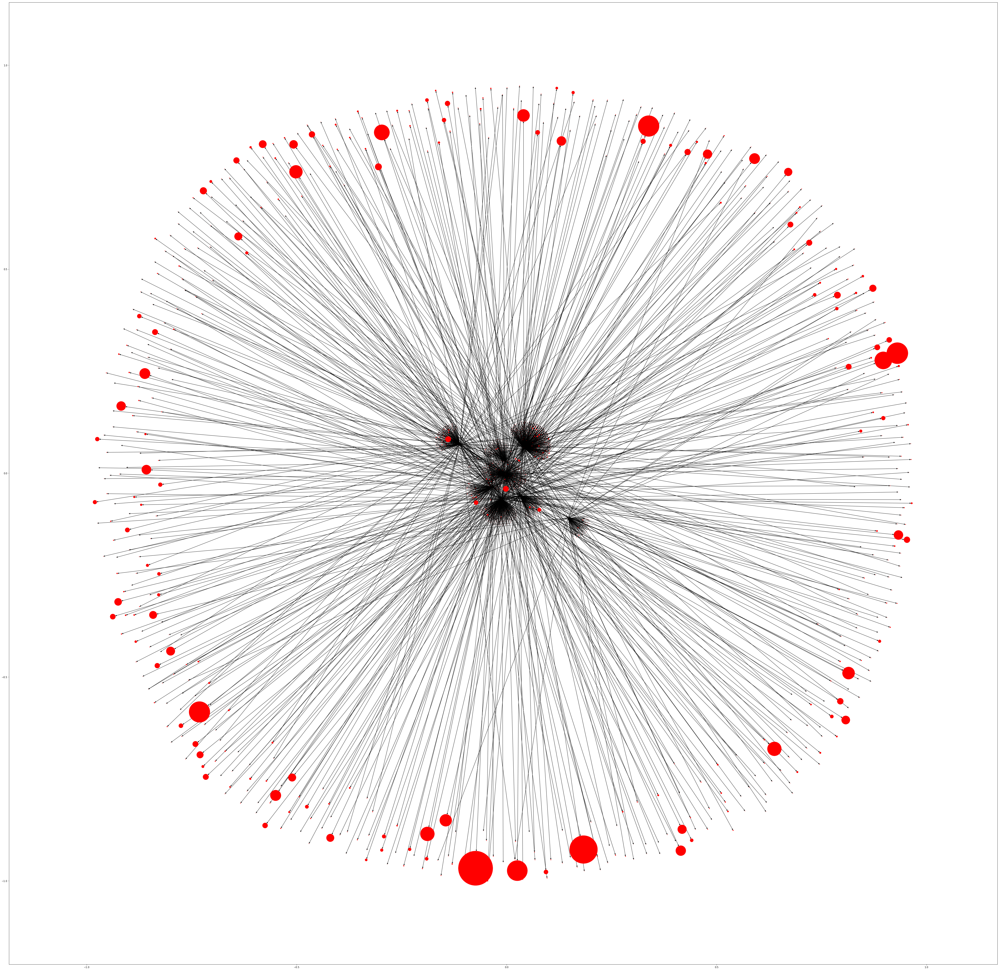

In [218]:
plt.figure(figsize=(75,75))
node_size = [0.0005*nx.get_node_attributes(graph, 'followers_count')[v] for v in graph]

nx.draw_networkx(graph, node_size=node_size, with_labels=False)
plt.savefig("Network.png", format="PNG")

In [102]:
users = ["bilcorry","sebastian_paul","BerghoferJulia","nukelar_juice","Taylor_SJ","Chrisjhancock","dangeruss86","Sofia_Wakum","TakaharuOgasa"]
for x in range(len(users)):
    t.add_attributes(users[x],graph)


535
151
184
168
103
187
61
30
61
30
77
338
73
132
68
241
149
192
249
294


In [188]:
numpy.savetxt("/Users/ryangould/Desktop/lab7/attributes.txt", [["Closeness Centrality: %s" % nx.closeness_centrality(graph)],["Out degree centrality: %s" % nx.out_degree_centrality(graph)],["In degree centrality: %s" % nx.in_degree_centrality(graph)],["transitivity: %d" % nx.transitivity(graph)],["density: %s" % nx.density(graph)],["Locations: %s" % nx.get_node_attributes(graph,'location')],["Friend Counts: %s" % nx.get_node_attributes(graph,'friends_count')],["Follower Counts: %s" % nx.get_node_attributes(graph,'followers_count')],["Statuses Counts: %s" % nx.get_node_attributes(graph,'statuses_count')]], fmt='%s')


In [189]:
closeness = nx.closeness_centrality(graph)

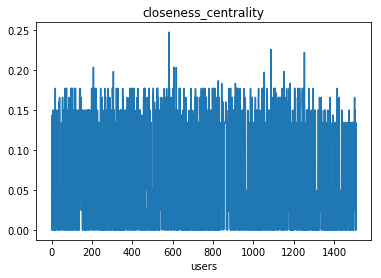

In [191]:
lists = sorted(closeness.items()) # sorted by key, return a list of tuples

x, y = zip(*lists) # unpack a list of pairs into two tuples

plt.plot(y)
plt.xlabel("users")
plt.title("closeness_centrality")
plt.show()

In [150]:
degree = nx.degree_centrality(graph)

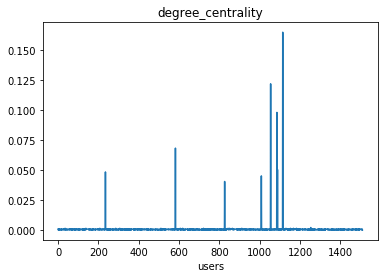

In [167]:
lists = sorted(degree.items()) # sorted by key, return a list of tuples

x, y = zip(*lists) # unpack a list of pairs into two tuples

plt.plot(y)
plt.xlabel("users")
plt.title("degree_centrality")
plt.show()

In [175]:
location = nx.get_node_attributes(graph,'statuses_count')

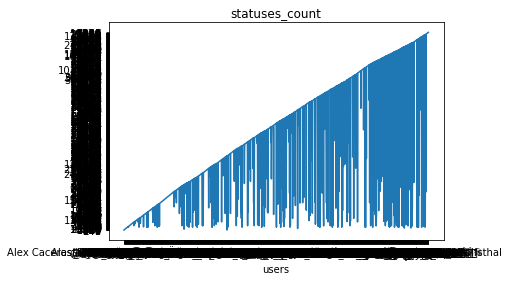

In [205]:
lists = sorted(location.items()) # sorted by key, return a list of tuples

x, y = zip(*lists) # unpack a list of pairs into two tuples

plt.plot(x,y)
plt.xlabel("users")
plt.title("statuses_count")
plt.show()

In [155]:
friends = nx.get_node_attributes(graph,'friends_count')

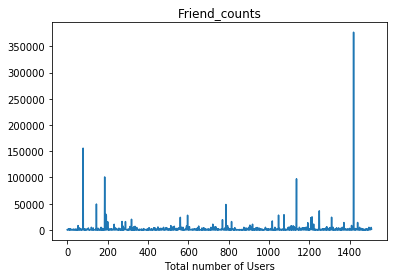

In [203]:
lists = sorted(friends.items()) # sorted by key, return a list of tuples

x, y = zip(*lists) # unpack a list of pairs into two tuples

plt.plot(y)
plt.xlabel("Total number of Users")
plt.title("Friend_counts")
plt.show()

In [158]:
followers = nx.get_node_attributes(graph,'followers_count')

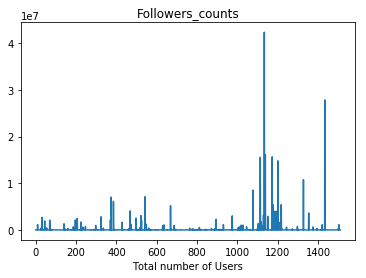

In [204]:
lists = sorted(followers.items()) # sorted by key, return a list of tuples

x, y = zip(*lists) # unpack a list of pairs into two tuples

plt.plot(y)
plt.xlabel("Total number of Users")
plt.title("Followers_counts")
plt.show()

In [178]:
summed = 0
for key, value in followers.items():
    summed += value
average = summed/len(followers)
average

198356.2582781457

In [179]:
summed1 = 0
for key, value in friends.items():
    summed1 += value
average1 = summed1/len(friends)
average1

1852.4523178807947

In [184]:
summed2 = 0
for key, value in indegree.items():
    summed2 += value
average2 = summed2/len(indegree)
average2

0.0008198052304275676

In [192]:
summed3 = 0
for key, value in closeness.items():
    summed3 += value
average3 = summed3/len(closeness)
average3

0.06789861627551852

In [195]:
betweenness = nx.betweenness_centrality(graph)

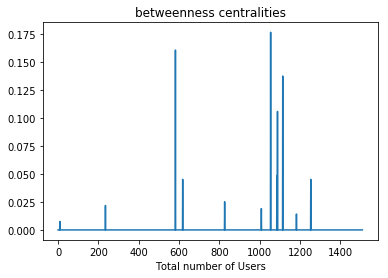

In [202]:
lists = sorted(betweenness.items()) # sorted by key, return a list of tuples

x, y = zip(*lists) # unpack a list of pairs into two tuples

plt.plot(y)
plt.xlabel("Total number of Users")
plt.title("betweenness centralities")
plt.show()

In [197]:
summed4 = 0
for key, value in betweenness.items():
    summed4 += value
average4 = summed4/len(betweenness)
average4

0.0005338833779925073